In [ ]:
#Jory Hamilton
#05/27/2024
#AAI-510
#HW3

#AI_TA helped with coding this assignment

#Importing libraries from HW Assignment #1
import pandas as pd #reads data file and data manipulation
import seaborn as sns #data visualization
import matplotlib.pyplot as plt #Subplots
%matplotlib inline


from google.colab import drive
drive.mount('/content/drive')

# List contents of the directory to verify the correct path
#!ls /content/drive/MyDrive/AAI_510/

# Adjusted path if necessary
data_path = "/content/drive/MyDrive/AAI_510/Heart_Disease_Prediction.csv"
data = pd.read_csv(data_path)

# Rename the column "Heart Disease" to "HD"
data.rename(columns={'Heart Disease': 'HD'}, inplace=True)

print(data.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
   Age  Sex  Chest pain type   BP  Cholesterol  FBS over 120  EKG results  \
0   70    1                4  130          322             0            2   
1   67    0                3  115          564             0            2   
2   57    1                2  124          261             0            0   
3   64    1                4  128          263             0            0   
4   74    0                2  120          269             0            2   

   Max HR  Exercise angina  ST depression  Slope of ST  \
0     109                0            2.4            2   
1     160                0            1.6            2   
2     141                0            0.3            1   
3     105                1            0.2            2   
4     121                1            0.2            1   

   Number of vessels fluro  Thallium        HD  
0         

In [ ]:
train_dropna = data.dropna()
train_dropna

#No rows with missing values

#The following would also be redundant code because no values are missing.
#train_fillna = data.fillna(0)
#train_fillna

,Age,Sex,Chest pain type,BP,Cholesterol,FBS over 120,EKG results,Max HR,Exercise angina,ST depression,Slope of ST,Number of vessels fluro,Thallium,HD
0,70,1,4,130,322,0,2,109,0,2.4,2,3,3,Presence
1,67,0,3,115,564,0,2,160,0,1.6,2,0,7,Absence
2,57,1,2,124,261,0,0,141,0,0.3,1,0,7,Presence
3,64,1,4,128,263,0,0,105,1,0.2,2,1,7,Absence
4,74,0,2,120,269,0,2,121,1,0.2,1,1,3,Absence
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,52,1,3,172,199,1,0,162,0,0.5,1,0,7,Absence
266,44,1,2,120,263,0,0,173,0,0.0,1,0,7,Absence
267,56,0,2,140,294,0,2,153,0,1.3,2,0,3,Absence
268,57,1,4,140,192,0,0,148,0,0.4,2,0,6,Absence


In [ ]:
!pip install scikit-learn

In [ ]:
from sklearn import tree #Import Tree Classifiers
from sklearn.ensemble import RandomForestClassifier #Import Random Forest Classifiers
from sklearn.model_selection import train_test_split,  RandomizedSearchCV #Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from scipy.stats import randint #Generate random numbers
from xgboost import XGBClassifier, plot_importance

In [ ]:
#Identifying categorical columns
categorical_cols = train_dropna.select_dtypes(include=['object']).columns
print("Categorical columns:", categorical_cols)

Categorical columns: Index(['HD'], dtype='object')


In [ ]:
#@title Loading data and viewing it
shap = train_dropna.shape
print("Shape of the dataframe (row, col):",shap,"\r\n")

#Provides a quick summary of columns and then show examples rows in the dataframe
for col in train_dropna.columns:
    print(train_dropna[col].describe())
# Print out target variable categorical counts
print(train_dropna['HD'].value_counts())
train_dropna.head()

Shape of the dataframe (row, col): (270, 14) 

count    270.000000
mean      54.433333
std        9.109067
min       29.000000
25%       48.000000
50%       55.000000
75%       61.000000
max       77.000000
Name: Age, dtype: float64
count    270.000000
mean       0.677778
std        0.468195
min        0.000000
25%        0.000000
50%        1.000000
75%        1.000000
max        1.000000
Name: Sex, dtype: float64
count    270.000000
mean       3.174074
std        0.950090
min        1.000000
25%        3.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: Chest pain type, dtype: float64
count    270.000000
mean     131.344444
std       17.861608
min       94.000000
25%      120.000000
50%      130.000000
75%      140.000000
max      200.000000
Name: BP, dtype: float64
count    270.000000
mean     249.659259
std       51.686237
min      126.000000
25%      213.000000
50%      245.000000
75%      280.000000
max      564.000000
Name: Cholesterol, dtype: float64
coun

,Age,Sex,Chest pain type,BP,Cholesterol,FBS over 120,EKG results,Max HR,Exercise angina,ST depression,Slope of ST,Number of vessels fluro,Thallium,HD
0,70,1,4,130,322,0,2,109,0,2.4,2,3,3,Presence
1,67,0,3,115,564,0,2,160,0,1.6,2,0,7,Absence
2,57,1,2,124,261,0,0,141,0,0.3,1,0,7,Presence
3,64,1,4,128,263,0,0,105,1,0.2,2,1,7,Absence
4,74,0,2,120,269,0,2,121,1,0.2,1,1,3,Absence


In [ ]:
train_dropna.tail()

,Age,Sex,Chest pain type,BP,Cholesterol,FBS over 120,EKG results,Max HR,Exercise angina,ST depression,Slope of ST,Number of vessels fluro,Thallium,HD
265,52,1,3,172,199,1,0,162,0,0.5,1,0,7,Absence
266,44,1,2,120,263,0,0,173,0,0.0,1,0,7,Absence
267,56,0,2,140,294,0,2,153,0,1.3,2,0,3,Absence
268,57,1,4,140,192,0,0,148,0,0.4,2,0,6,Absence
269,67,1,4,160,286,0,2,108,1,1.5,2,3,3,Presence


In [ ]:
#@title Designating target and features
y = train_dropna.HD # Target variable
X = train_dropna.drop(columns=['HD']) # Features by dropping the target column

In [ ]:
#@title Splitting dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test/valid

#Checking the shapes of the sets to ensure the split is correct
print("X Train Data Shape:", X_train.shape)
print("X Test Data Shape:", X_test.shape)
print("Y Train Data Shape:", y_train.shape)
print("Y Test Data Shape:", y_test.shape)

X Train Data Shape: (189, 13)
X Test Data Shape: (81, 13)
Y Train Data Shape: (189,)
Y Test Data Shape: (81,)


In [ ]:
#@title Building the Decision Tree
clf = tree.DecisionTreeClassifier() #Creating Decision Tree classifer object
clf = clf.fit(X_train, y_train) #Training Decision Tree Classifer

In [ ]:
#@title Evaluating the Tree model
y_hat = clf.predict(X_train) # Predict the response for train dataset

y_pred = clf.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 1.0
Test Accuracy: 0.6790123456790124


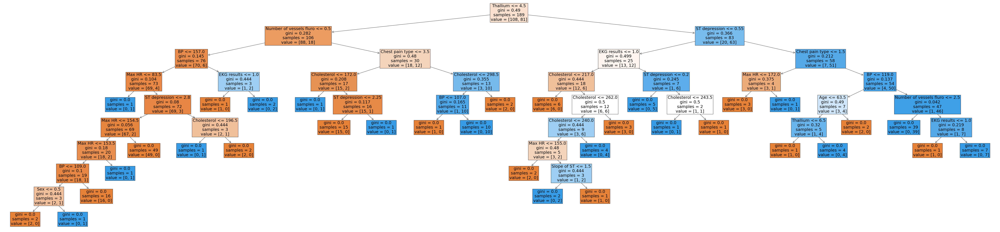

In [ ]:
#@title Visualizing the Tree


plt.figure(figsize=(95,22))  # Width and height in inches
f_names=list(X.columns) # Feature names
tree.plot_tree(clf, filled=True, feature_names=f_names, fontsize=22) # Plot the tree
plt.show() #Show the decision tree without the rules in plain text

#Hard to read without zooming a lot

## Tuning the Tree (Single Classification)

In [ ]:
# Create Decision Tree classifer object by spefifying parameters
# Try using max_depth=3, min_samples_split=100, min_samples_leaf=2, criterion="entropy"
clf = tree.DecisionTreeClassifier(max_depth=3, min_samples_leaf=2, criterion='entropy')

# Train and test the classifier
clf = clf.fit(X_train, y_train) # Train Decision Tree Classifer
y_hat = clf.predict(X_train) # Predict the response for train dataset
y_pred = clf.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

plt.rcParams['figure.dpi'] = 400 # To increase the resolution from 100dpi to 400dpi

# Plot the tree
plt.figure(figsize=(95,22))  # Width and height in inches
f_names=list(X.columns) # Feature names
tree.plot_tree(clf, filled=True, feature_names=f_names) # Plot the tree
plt.show() #Show decision tree without the rules in plain text

Train Accuracy: 0.8677248677248677
Test Accuracy: 0.7901234567901234


In [ ]:
import numpy as np

# Initialize lists to store tree importances and impurities
impurities = {"entropy": []}

# Iterate through each tree in the forest (if rf is a RandomForestClassifier)
for estimator in rf.estimators_:
    impurities["entropy"].append(np.mean(estimator.tree_.impurity))

# Print the summary
print("Average Entropy:", np.mean(impurities["entropy"]))

Average Entropy: 0.16793621835822936


Precision: 0.7901083457999002
Recall: 0.7901234567901234


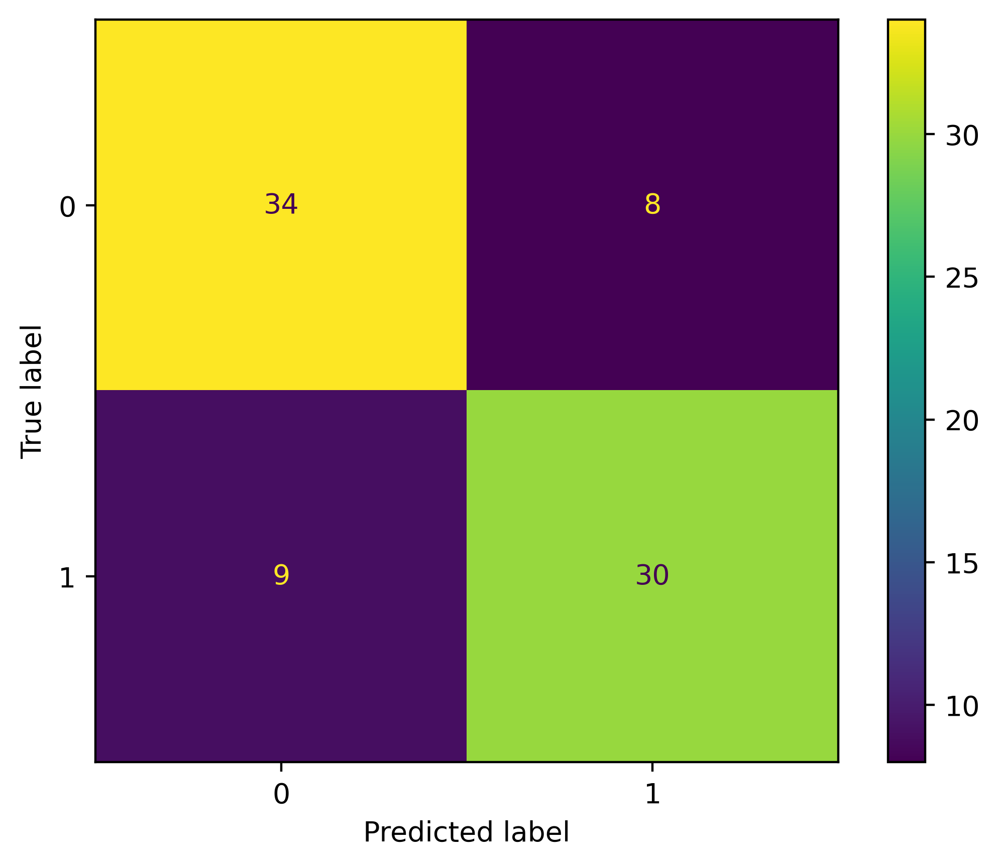

In [ ]:
# Additional Evaluation Metrics
print("Precision:", metrics.precision_score(y_test, y_pred, average='weighted'))  # Note - multi-class problem so not straightforward!
print("Recall:", metrics.recall_score(y_test, y_pred, average='weighted'))  # Note - multi-class problem so not straightforward!

# Create the confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)

# Display the confusion matrix
metrics.ConfusionMatrixDisplay(confusion_matrix=cm).plot()
plt.show()

In [ ]:
#@title Building the Random Forest

rf = RandomForestClassifier(random_state=100) # Create Fandom Forest classifer object
rf = rf.fit(X_train, y_train) # Train Random Forest Classifer

In [ ]:
#@title Evaluating the RF model
y_hat = rf.predict(X_train) # Predict the response for train dataset

y_pred = rf.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 1.0
Test Accuracy: 0.8148148148148148


In [ ]:
#@title Visualizing few trees of the RF

f_names=list(X.columns) # Feature names
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(10,2), dpi=3000) # Setup the 1x5 grid for ploting the trees
for index in range(0, 5): # Iterate through the first five trees (of 100)
  tree.plot_tree(rf.estimators_[index], feature_names=f_names, filled = True, ax=axes[index]); # Plot the tree
  axes[index].set_title('Estimator: ' + str(index), fontsize = 11) # Print title

In [ ]:

# Initialize lists to store tree importances and impurities
impurities = {"Gini": []}

# Iterate through each tree in the forest
for estimator in rf.estimators_:
    impurities["Gini"].append(estimator.tree_.impurity.mean())

# Print the summary
print("Average Gini:", np.mean(impurities["Gini"]))

Average Gini: 0.16793621835822936


In [ ]:
#@title Tuning the RF
# Create RF classifer object by spefifying parameters
# Try using n_estimators=200, max_depth=2
rf = RandomForestClassifier(n_estimators=200, max_depth=2, random_state=0) # Create Random Forest classifer object
rf = rf.fit(X_train, y_train) # Train Random Forest Classifer

# Train and test the classifier
rf = rf.fit(X_train, y_train) # Train Decision Tree Classifer
y_hat = rf.predict(X_train) # Predict the response for train dataset
y_pred = rf.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 0.8571428571428571
Test Accuracy: 0.8271604938271605


In [ ]:
#@title Hyperparameter search
param_dist = {'n_estimators': randint(50,1000), 'max_depth': randint(1,20)} #Increasing upper parameter from 500 to 1000 improved accuracy u
rf = RandomForestClassifier() #Creating a random forest classifier
rand_search = RandomizedSearchCV(rf, param_distributions=param_dist, n_iter=5, cv=5) #Using random search to find the best hyperparameters
rand_search.fit(X_train, y_train) #Fitting the random search object to the training data
print('Best hyperparameters:',  rand_search.best_params_)

best_rf = rand_search.best_estimator_ #Capturing the best model
y_hat = best_rf.predict(X_train) #Predicting the response for train dataset
y_pred = best_rf.predict(X_test) #Predicting the response for test dataset

#Computing training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Best hyperparameters: {'max_depth': 19, 'n_estimators': 673}
Train Accuracy: 1.0
Test Accuracy: 0.8024691358024691


Precision: 0.8047389003910744
Recall: 0.8024691358024691


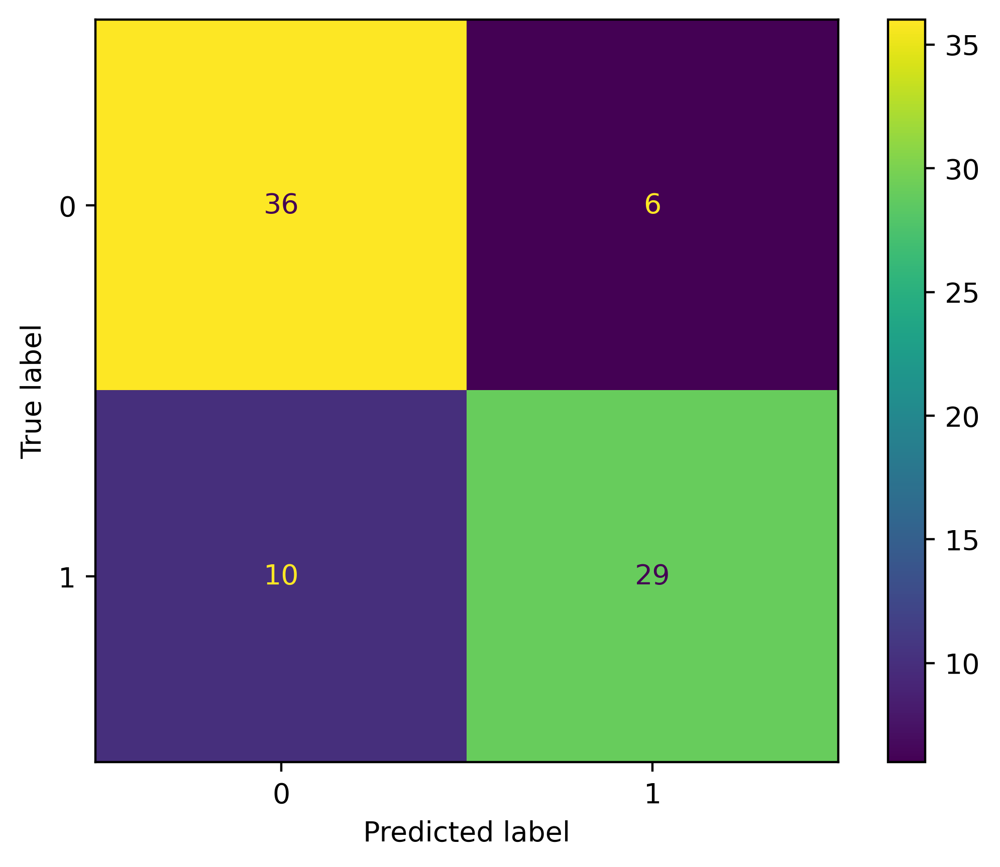

In [ ]:
#@title More Evaluation Metrics

print("Precision:", metrics.precision_score(y_test, y_pred, average = 'weighted')) # Note - multi-class problem so not straight forward!
print("Recall:", metrics.recall_score(y_test, y_pred, average = 'weighted')) # Note - multi-class problem so not straight forward!

# Create the confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)
metrics.ConfusionMatrixDisplay(confusion_matrix=cm).plot();


## XGBOOST

In [ ]:
# Need to convert categorical to numeric in target variable

y_xgb = y.astype('category').cat.codes

# Splitting dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y_xgb, test_size=0.3, random_state=1) # 70% training and 30% test/valid

In [ ]:
bst = XGBClassifier(enable_categorical=True).fit(X_train, y_train)
y_hat = bst.predict(X_train) # Predict the response for train dataset
y_pred = bst.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 1.0
Test Accuracy: 0.7901234567901234


In [ ]:
# Hyperparameter optimization
# Experiment with learning rate, number of trees, subsample

bst_hyp = XGBClassifier(enable_categorical=True,
                        learning_rate = 0.05,
                        max_depth = 10,
                        n_estimators = 20,
                        objective='multi:softmax',
                        num_class=3,
                        subsample = 0.8) # Lowering subsample will reduce data available in each tree
bst_hyp_mod = bst_hyp.fit(X_train, y_train)

y_hat = bst_hyp_mod.predict(X_train) # Predict the response for train dataset
y_pred = bst_hyp_mod.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 0.9735449735449735
Test Accuracy: 0.7901234567901234


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

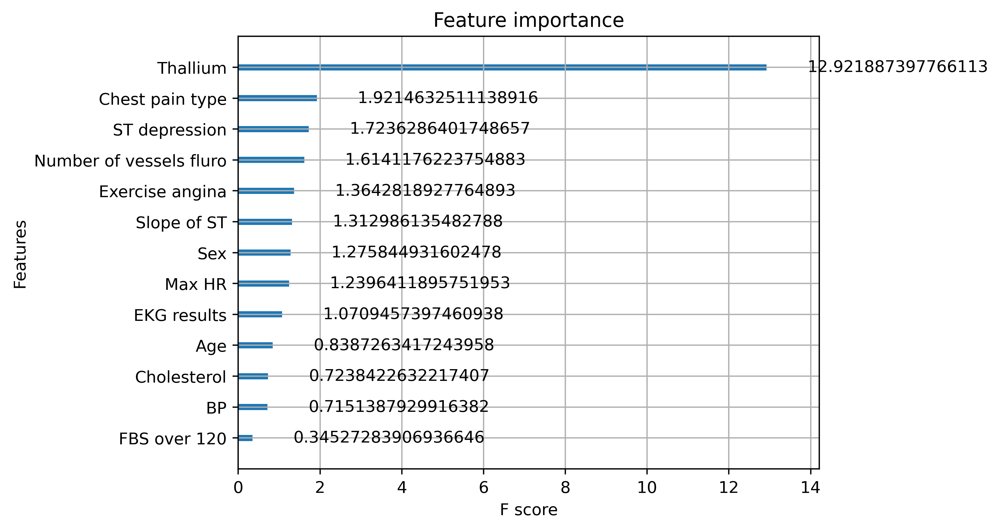

In [ ]:
#Feature Importance - helpful way to understand what is driving predictions in tree-based models
# 'gain' shows the average gain of splits which use the feature, 'weight' shows the number of time a feature appears in a tree
plot_importance(bst_hyp_mod, importance_type = 'gain') # try 'weight' to see if the interpretation changes

In [ ]:
## Random forest better than single classification (accur., prec. recall)

Tuning the tree in the single classification provided approximately 86% train accuracy, 79% test accuracy, possibly 17% for the average entropy (not sure if I calculated/interpreted that value correctly; measure of uncertainty), precision of 79% and recall of 79%.

Using a random forest resulted in 93% train accuracy, 85% test accuracy, possibly 17% for the average gini (not sure if I calculated/interpreted that value correctly; measure for impurity), 85% precision, and 85% recall.

I am not quite sure how to interpret confusion matrix tables quite yet, but I suspect additional info could be considered in both the decision tree (single classification) and random forest. I also may have calculated the average gini value for the random forest and accidentally labeled the same value as the average entropy for the single classification decision tree. I am also not an average of either measurement encapsulates the information they convey (e.g., going from one box to another).

However, given that I could not quite see (visibility) or know how to interpret multiple values of gini and entropy or what to do when they with an entire tree (versus from one box to another), the random forest provided better accuracy, precision and recall than the single classification decision tree.

## Side note for Final Project (Team #2)


As a side note, XBOOST shows that Thallium is by the biggest indicator for heart disease based on the process I used through the Lab 3 Walkthrough. I will bring this finding for evaluation to my Team #2 partners.